In [ ]:
from singleCAM_IROS._pipeline_support import _handle_dirpaths

from pathlib import Path

import numpy as np
import pandas as pd

from bloodmoon.io import simulation_files
from bloodmoon.mask import codedmask

import darksun as ds


#SAVEFIG_PATH = "/home/edoardo/Desktop/mask_summer_2021_infdet_singleCAM_smoothing"
SAVEFIG_PATH = "/home/edoardo/Desktop/mask_NTHT_infdet_singleCAM_testing_smoothing_skyvarlogic_clipdet"
FRMT = "png"

def savefig(figname: str) -> str:
    """Defines dirpath location to save a Figure."""
    return f'{SAVEFIG_PATH}/{figname}.{FRMT}'

def is_img(name: str) -> str | None:
    """Checks if a Figure has been already saved."""
    filepath: str = savefig(name)
    if Path(filepath).is_file():
        return None
    return filepath

In [2]:
skyfield = "GalacticCenter"

#mask_FITS = "wfm_mask_summer2021.fits"
#data_FITS = "galctr_rxte-sax_mask_summer2021_infdet_2-50keV_1ks"

mask_FITS = "wfm_mask_NTHT_20250725.fits"
data_FITS = "galctr_rxte-sax_mask_050_1040x17_infdet_2-50keV_1ks"

N_TEST = "singleCAM_iros_testing_smoothing_skyvarlogic_clipdet"

mask_path, simul_data, save_path = _handle_dirpaths(
    mask=mask_FITS,
    skyfield=skyfield,
    simul=data_FITS,
    run_name=N_TEST,
)

VIGNETTING = True
PSFY = False
UPX, UPY = 5, 1
wfm = codedmask(mask_path, UPX, UPY)

cam_a = "cam1a"
cam_b = "cam1b"
dataset = 'detected'

filepaths = simulation_files(simul_data)
sdlA = ds.get_data(filepaths[cam_a][dataset])
catalogueA = ds.get_catalogue(filepaths[cam_a]['sources'])
sdlB = ds.get_data(filepaths[cam_b][dataset])
catalogueB = ds.get_catalogue(filepaths[cam_b]['sources'])

simul_sky_camA, _ = ds.load_sky(save_path + f"sky_SIMUL_CAM1A_TEST_{N_TEST}.fits")
simul_sky_camB, _ = ds.load_sky(save_path + f"sky_SIMUL_CAM1B_TEST_{N_TEST}.fits")
log_camA, log_camB = ds.load_database(save_path + f"IROS_sources_database_TEST_{N_TEST}.fits")

# Loading data...
# Loading completed!
# Loading data...
# Loading completed!
# Loading data...
# Loading completed!


In [3]:
dfA = pd.DataFrame(
    {
        log_camA.name: log_camA.log['ID'],
        f"{log_camA.name} SNR": log_camA.log['snr'],
        #"Same Source": np.array(log_camA.log['ID']) == np.array(log_camB.log['ID']),
    }
)

dfB = pd.DataFrame(
    {
        log_camB.name: log_camB.log['ID'],
        f"{log_camB.name} SNR": log_camB.log['snr'],
    }
)

In [4]:
dfA

,CAM1A,CAM1A SNR
0,scox1,748.772333
1,gx5-1,78.015698
2,gx349+2,60.215866
3,gx17+2,51.787398
4,gx9+1,44.890845
5,gx340+0,34.687231
6,groj1655-40,28.617328
7,gx3+1,26.205052
8,gx13+1,25.216202
9,x1820-303,24.437017


In [5]:
dfB

,CAM1B,CAM1B SNR
0,scox1,700.488189
1,gx5-1,82.359983
2,gx349+2,58.086503
3,gx17+2,57.568001
4,gx9+1,41.448265
5,gx340+0,34.697179
6,groj1655-40,28.785238
7,gx13+1,27.170528
8,gx3+1,26.247248
9,x1820-303,23.607487


Source LEMX-CAM1AS1 not in catalogue...
Source LEMX-CAM1AS2 not in catalogue...
Source LEMX-CAM1AS3 not in catalogue...
Source LEMX-CAM1AS4 not in catalogue...


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

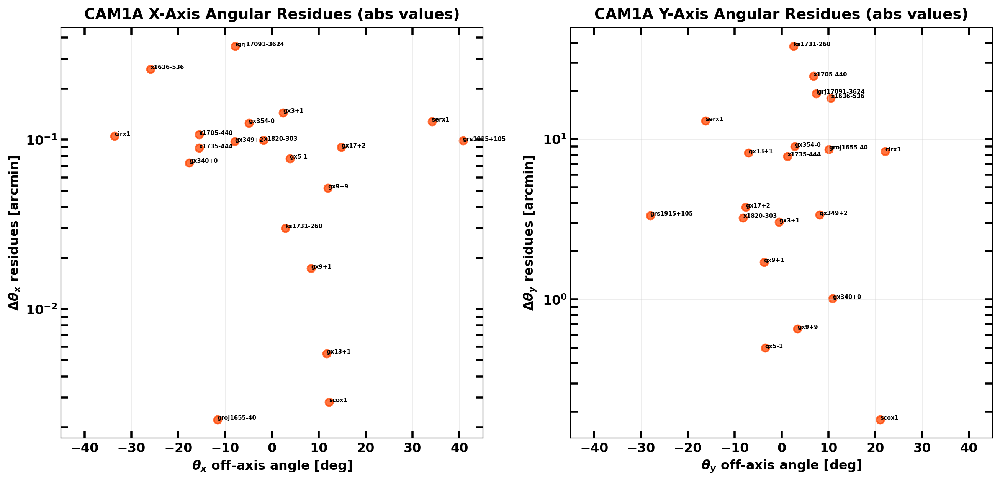

In [6]:
from typing import NamedTuple

from bloodmoon.mask import CodedMaskCamera
from bloodmoon.types import CoordEquatorial
from bloodmoon.coords import equatorial2shift, shift2angle

from darksun.types import Tag
from darksun.data import Log, DataLoader, CatalogueLoader

class CoordAngular(NamedTuple):
    """
    Local frame coded-mask camera angular coordinates.

    Args:
        theta_x (float): Angular coord along x-axis [deg]
        theta_y (float): Angular coord along y-axis [deg]
    """
    theta_x: float
    theta_y: float

def extract_catalogue_equatorial_coords(
    log: Log,
    catalogue: CatalogueLoader,
) -> tuple[tuple[str, CoordEquatorial]]:
    """
    """
    sources, ras, decs = [], [], []
    for s_id in log.log['ID']:
        if s_id in catalogue.DLdata['ID']:
            source = catalogue.DLdata[(catalogue.DLdata['ID'] == s_id)]
            sources.append(s_id)
            ras.append(source['RA'])
            decs.append(source['DEC'])
        else:
            print(f'Source {s_id.upper()} not in catalogue...')
            sources.append(s_id)
            ras.append(-999)
            decs.append(-999)
    return tuple(
        (name, CoordEquatorial(ra, dec)) for name, ra, dec in zip(sources, ras, decs)
    )

def extract_catalogue_angular_coords(
    log: Log,
    catalogue: CatalogueLoader,
    sdl: DataLoader,
    camera: CodedMaskCamera,
) -> tuple[tuple[str, CoordAngular]]:
    """
    """
    sources, thetas_x, thetas_y = [], [], []
    for s_id in log.log['ID']:
        if s_id in catalogue.DLdata['ID']:
            source = catalogue.DLdata[(catalogue.DLdata['ID'] == s_id)]
            sources.append(s_id)
            sx, sy = equatorial2shift(sdl, camera, source['RA'], source['DEC'])
            thetas_x.append(shift2angle(camera, sx))
            thetas_y.append(shift2angle(camera, sy))
        else:
            print(f'Source {s_id.upper()} not in catalogue...')
            sources.append(s_id)
            thetas_x.append(np.nan)
            thetas_y.append(np.nan)
    return tuple(
        (name, CoordAngular(tx, ty)) for name, tx, ty in zip(sources, thetas_x, thetas_y)
    )


_, cat_theta = zip(
    *extract_catalogue_angular_coords(log=log_camA, catalogue=catalogueA, sdl=sdlA, camera=wfm)
)
cat_thetax, cat_thetay = zip(*cat_theta)

tagsx = tuple(
    Tag(n, r, t) for n, r, t in zip(
        log_camA.log['ID'], 60 * np.abs(np.array(log_camA.log['angle_x']) - np.array(cat_thetax)), cat_thetax,
    )
)
dmapx = ds.map4biplot(
    arrs=60 * np.abs(np.array(log_camA.log['angle_x']) - np.array(cat_thetax)),
    title=f'{log_camA.name} X-Axis Angular Residues (abs values)',
    xlabel='$\\theta_{{x}}$ off-axis angle [deg]',
    ylabel='$\\Delta\\theta_{{x}}$ residues [arcmin]',
    x=np.array(cat_thetax),
    style='scatter',
    color='OrangeRed',
    xlim=(-45, 45),
    yscale='log',
    tags=tagsx,
)
tagsy = tuple(
    Tag(n, r, t) for n, r, t in zip(
        log_camA.log['ID'], 60 * np.abs(np.array(log_camA.log['angle_y']) - np.array(cat_thetay)), cat_thetay,
    )
)
dmapy = ds.map4biplot(
    arrs=60 * np.abs(np.array(log_camA.log['angle_y']) - np.array(cat_thetay)),
    title=f'{log_camA.name} Y-Axis Angular Residues (abs values)',
    xlabel='$\\theta_{{y}}$ off-axis angle [deg]',
    ylabel='$\\Delta\\theta_{{y}}$ residues [arcmin]',
    x=np.array(cat_thetay),
    style='scatter',
    color='OrangeRed',
    xlim=(-45, 45),
    yscale='log',
    tags=tagsy,
)
ds.biplot(dmapx, dmapy, is_img('theta_res'))

In [7]:
from typing import Any
from numpy.typing import NDArray
from pandas import DataFrame

def dict2df(data: dict[str, dict[str, Any]]) -> DataFrame:
    """
    Converts input data in a Pandas dataframe.

    Args:
        data (dict): Input data.
    
    Returns:
        output (DataFrame): Output dataframe.
    """
    df = DataFrame({
        (cam, param): values
        for cam, cam_data in data.items() 
        for param, values in cam_data.items()
    })
    return df


def get_angularcoords_residues(
    log: Log,
    catalogue: CatalogueLoader,
    sdl: DataLoader,
    camera: CodedMaskCamera,
) -> tuple[NDArray, NDArray]:
    """
    """
    _, cat_theta = zip(
        *extract_catalogue_angular_coords(log=log, catalogue=catalogue, sdl=sdl, camera=camera)
    )
    cat_thetax, cat_thetay = zip(*cat_theta)
    resx = 60 * np.abs(np.array(log.log['angle_x']) - np.array(cat_thetax))
    resy = 60 * np.abs(np.array(log.log['angle_y']) - np.array(cat_thetay))
    return resx, resy

resxA, resyA = get_angularcoords_residues(log=log_camA, catalogue=catalogueA, sdl=sdlA, camera=wfm)
resxB, resyB = get_angularcoords_residues(log=log_camB, catalogue=catalogueB, sdl=sdlB, camera=wfm)

dmapA = {
    log_camA.name: {
        'ID': log_camA.log['ID'],
        'SNR': log_camA.log['snr'],
        'DthetaX [arcmin]': resxA,
        'DthetaY [arcmin]': resyA,
    },
}

dmapB = {
    log_camB.name: {
        'ID': log_camB.log['ID'],
        'SNR': log_camB.log['snr'],
        'DthetaX [arcmin]': resxB,
        'DthetaY [arcmin]': resyB,
    },
}

Source LEMX-CAM1AS1 not in catalogue...
Source LEMX-CAM1AS2 not in catalogue...
Source LEMX-CAM1AS3 not in catalogue...
Source LEMX-CAM1AS4 not in catalogue...
Source LEMX-CAM1BS1 not in catalogue...


In [8]:
dict2df(dmapA)

CAM1A                                              
                ID         SNR DthetaX [arcmin] DthetaY [arcmin]
0            scox1  748.772333         0.002819         0.178235
1            gx5-1   78.015698         0.077242         0.498126
2          gx349+2   60.215866         0.097495         3.370313
3           gx17+2   51.787398         0.090047         3.759243
4            gx9+1   44.890845         0.017353         1.708471
5          gx340+0   34.687231         0.073008         1.010713
6      groj1655-40   28.617328         0.002225         8.625777
7            gx3+1   26.205052         0.144247         3.036099
8           gx13+1   25.216202         0.005457         8.203447
9        x1820-303   24.437017         0.099016         3.233336
10           gx9+9   23.673900         0.051675         0.654994
11           cirx1   27.197753         0.104945         8.409155
12       x1705-440   15.252635         0.107004        24.680640
13       x1735-444   13.331888         0.089096         7.833932
14         gx354-0    7.397212         0.125249         9.005816
15     grs1915+105   16.463589         0.098376         3.342689
16      ks1731-260    6.043712         0.030029        38.050386
17           serx1    8.366301         0.127901        13.006361
18       x1636-536    7.017307         0.261004        17.999396
19  igrj17091-3624    5.460874         0.356408        19.269925
20    lemx-cam1aS1    5.103898              NaN              NaN
21    lemx-cam1aS2    5.187861              NaN              NaN
22    lemx-cam1aS3    5.183448              NaN              NaN
23    lemx-cam1aS4    5.171539              NaN              NaN

In [9]:
dict2df(dmapB)

CAM1B                                              
                ID         SNR DthetaX [arcmin] DthetaY [arcmin]
0            scox1  700.488189         0.005398         0.081032
1            gx5-1   82.359983         0.097030         2.308425
2          gx349+2   58.086503         0.031423         6.206086
3           gx17+2   57.568001         0.105845         1.099813
4            gx9+1   41.448265         0.047842         0.833814
5          gx340+0   34.697179         0.076772         4.020280
6      groj1655-40   28.785238         0.332812         3.188177
7           gx13+1   27.170528         0.213265         1.955389
8            gx3+1   26.247248         0.102875         8.627426
9        x1820-303   23.607487         0.013186         1.296882
10           gx9+9   20.527484         0.056542         1.870645
11           cirx1   28.203086         0.063340         0.002702
12       x1705-440   16.455665         0.117742        10.230965
13       x1735-444   14.882695         0.233628         8.991753
14         gx354-0    8.096321         0.507079         0.994733
15     grs1915+105   20.670610         0.060917         0.006681
16      ks1731-260    6.445621         0.257176        20.627675
17  igrj17091-3624    6.077630         1.052929        16.199341
18       x1724-307    5.838476         0.189197        25.858881
19   maxij1659-152    5.702985         2.517462        94.807894
20         gx339-4    5.675791         0.803239        35.709514
21       x1636-536    6.337549         0.225505         5.764133
22           serx1    7.109226         0.121915         2.193528
23       x1630-472    5.067705         0.119211        23.557329
24    lemx-cam1bS1    5.226285              NaN              NaN

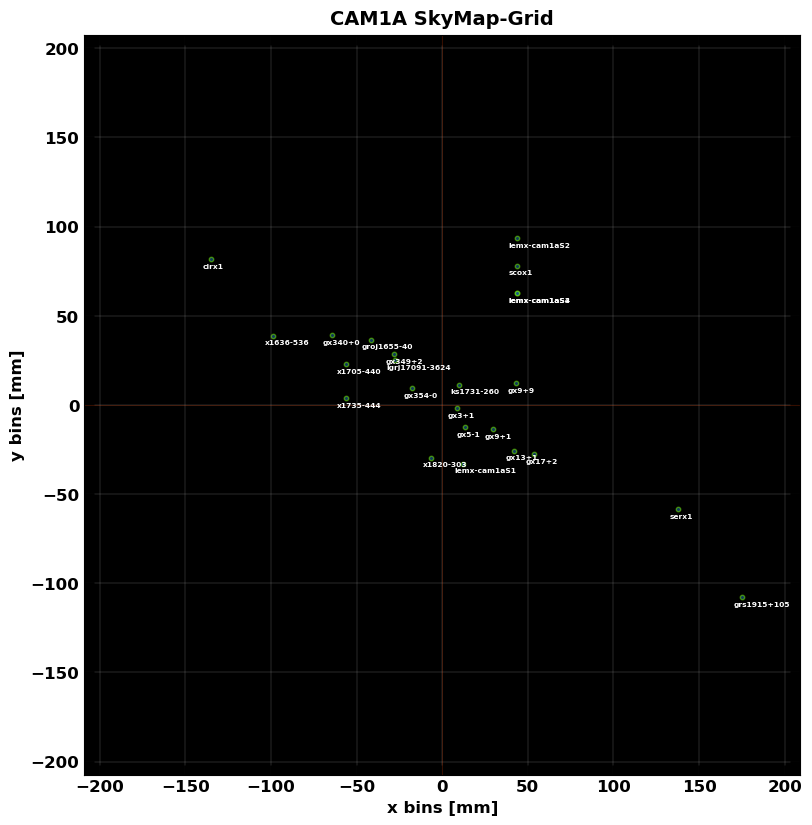

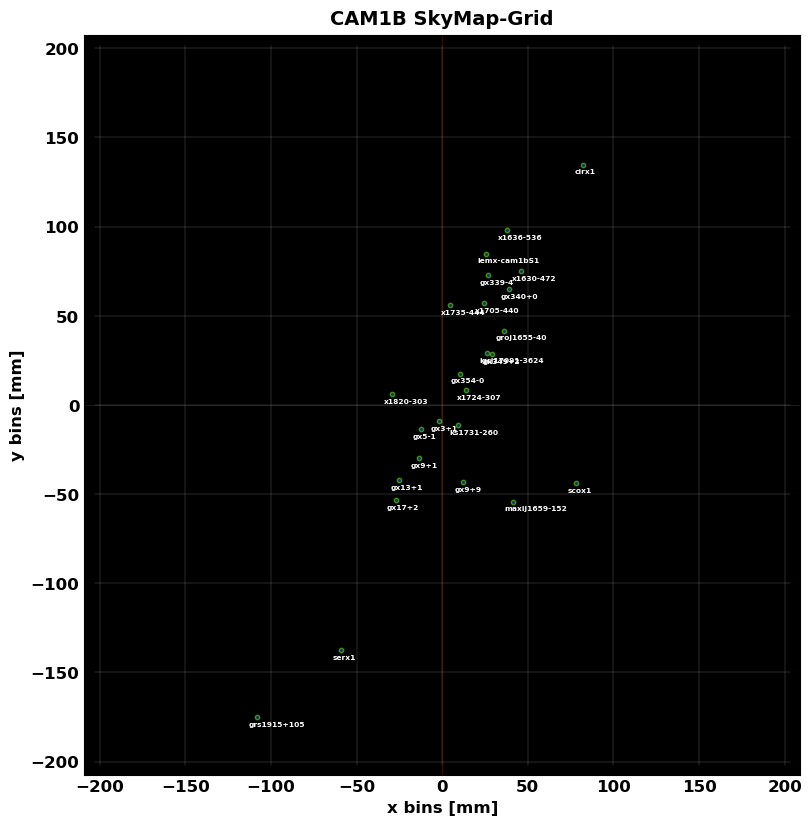

In [10]:
ds.skyfield_map(log_camA, wfm, save_to=is_img(f'skymap_grid_{log_camA.name}'))
ds.skyfield_map(log_camB, wfm, save_to=is_img(f'skymap_grid_{log_camB.name}'))

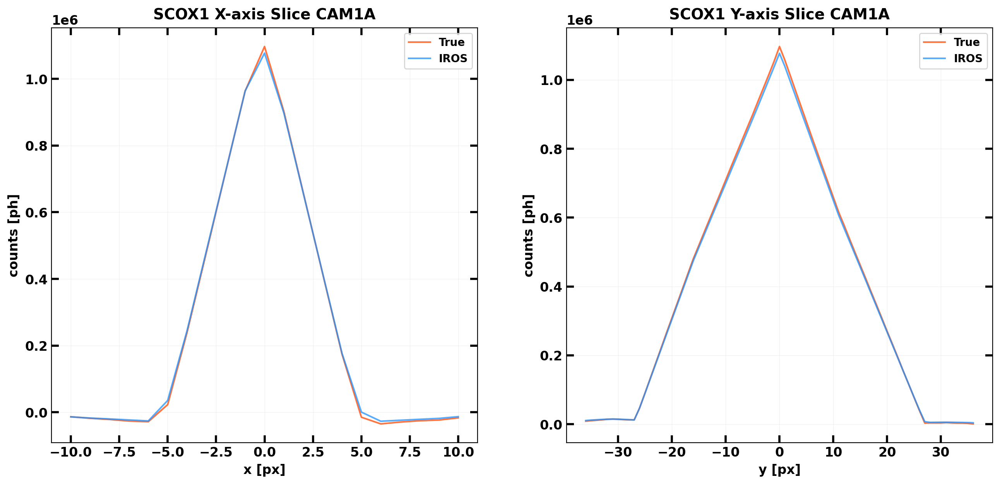

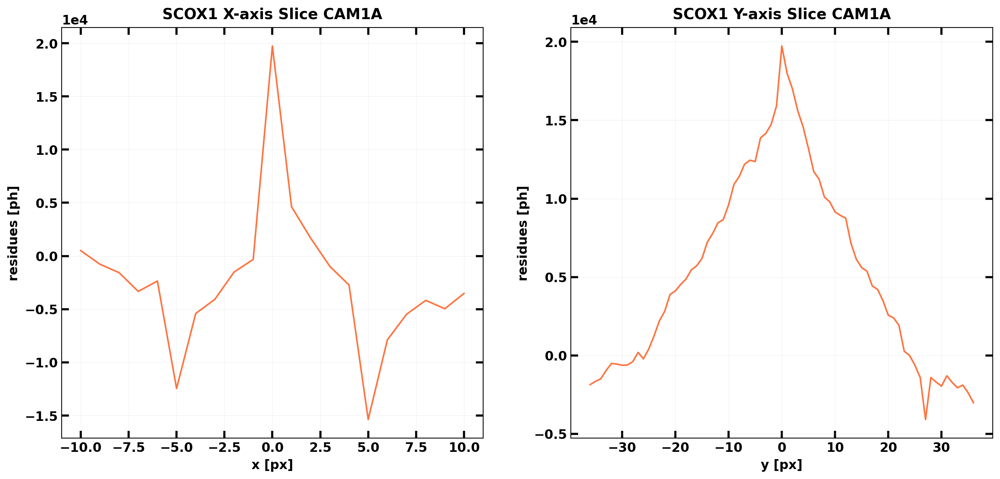

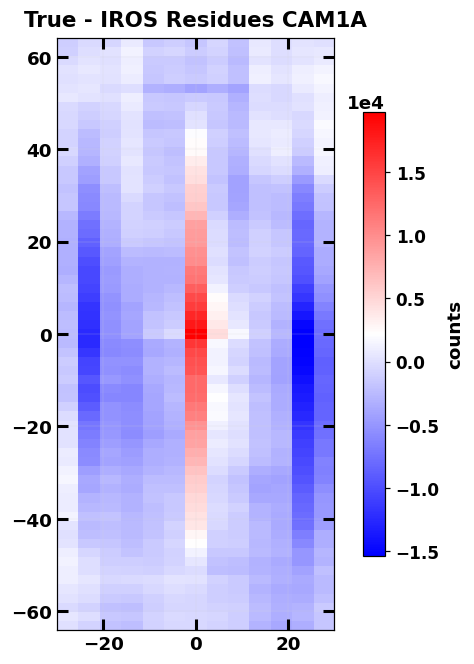

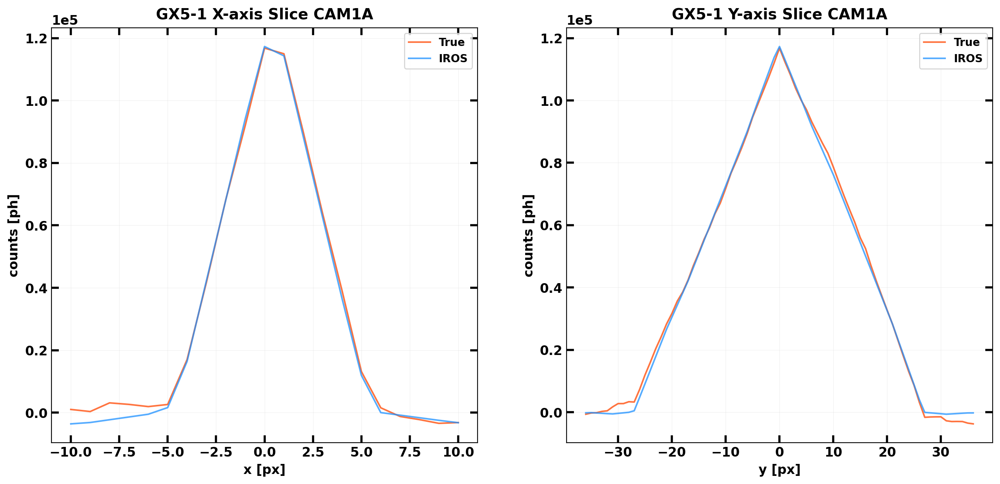

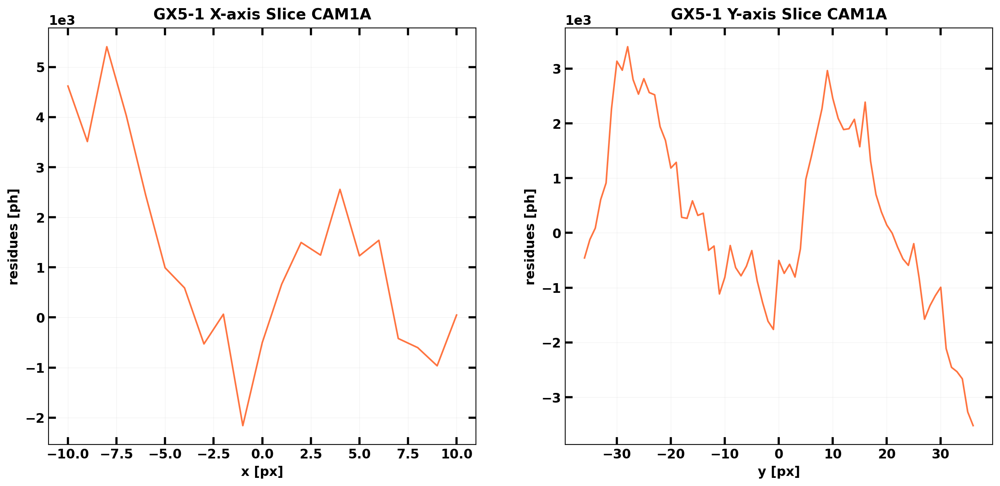

...

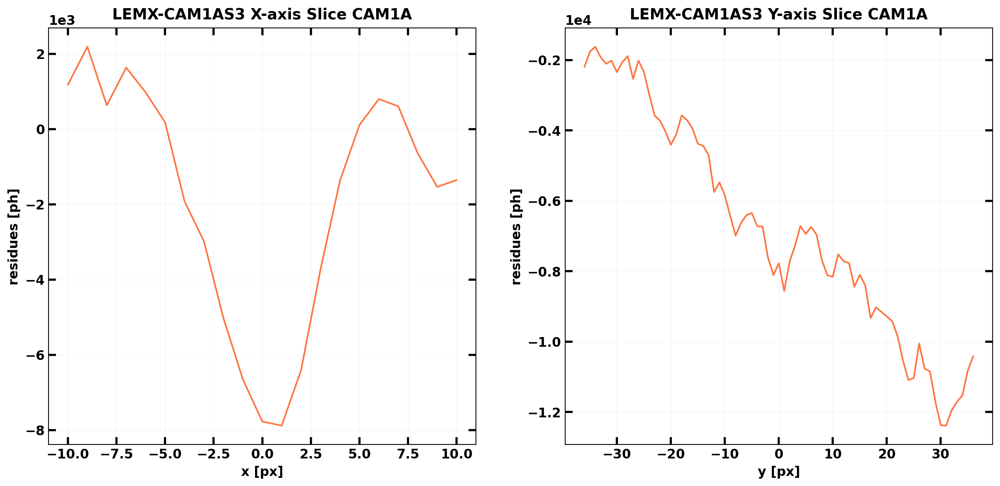

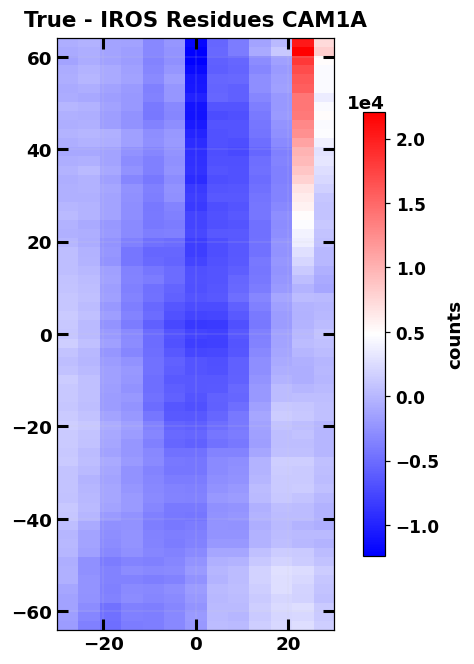

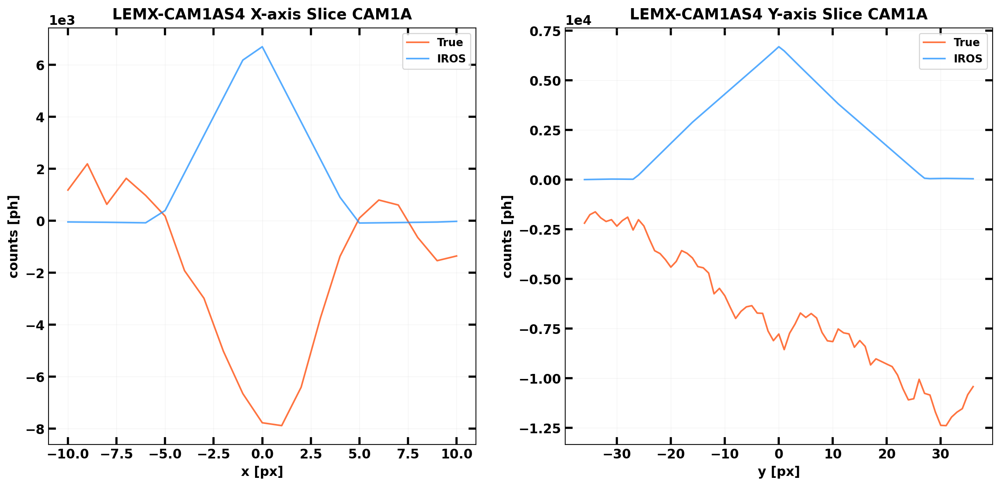

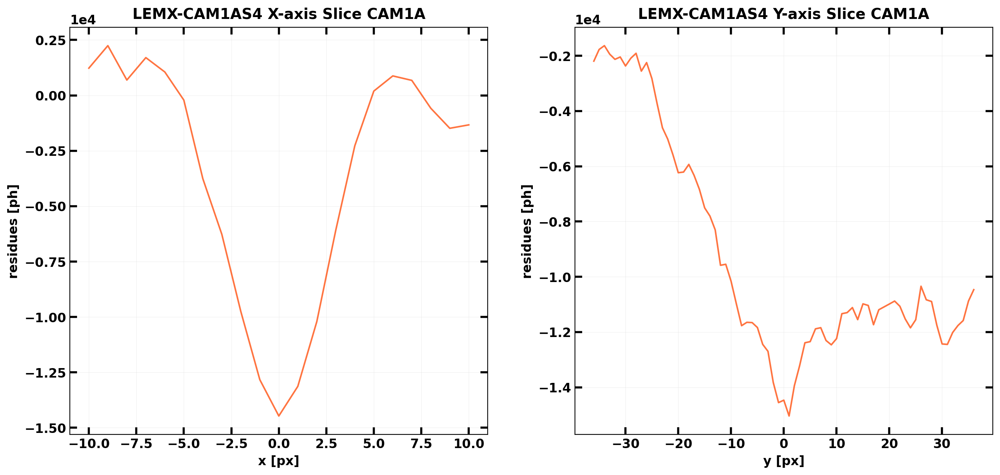

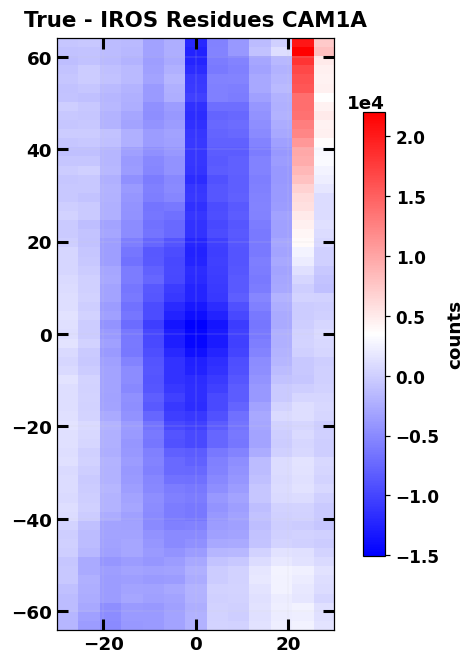

In [11]:
cropx, cropy = (
    int(wfm.specs["slit_deltax"] * UPX / wfm.specs["mask_deltax"] + 5),
    int(wfm.specs["slit_deltay"] * UPY / wfm.specs["mask_deltay"] + 5),
)
ds.reconstruction_plot(
    true_sky=simul_sky_camA,
    log=log_camA,
    crp=(cropy, cropx),
    camera=wfm,
    vignetting=VIGNETTING,
    psfy=PSFY,
    savepath=is_img,
)